# This notebook looks at the impact of random force errors on the M1S3 surface shape

o. nonrepeatable force error is assumed to be +/- 1N

o. repeatable force error is assumed to be +/- 10N

Summary:

RMS=1N random force error results in ~15nm astigmatism and ~5nm focus.

RMS=10N random force error results in ~150nm astigmatism and ~50nm focus.

In [15]:
import numpy as np
import pandas as pd
import scipy.io

import matplotlib.pyplot as plt

plt.jet()

%matplotlib inline

<Figure size 640x480 with 0 Axes>

In [13]:
dataFolder = '/Users/bxin/Library/CloudStorage/OneDrive-SharedLibraries-GMTOCorp/M1S Portal - Documents'

#read Afz (Fz influence matrix)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/Afz-13-Apr-2023.csv', header=None)
Afz = np.array(df)
print('Afz = ',Afz.shape)
# this is Afz only; it is 27685 x 170.

#read Fz Bending Modes & forces
df = pd.read_csv(dataFolder+'/influnce_matrix_files/U-13-Apr-2023.csv', header=None)
UMat = np.array(df)
print('U matrix', UMat.shape)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/V-13-Apr-2023.csv', header=None)
VMat = np.array(df)
print('V matrix', VMat.shape)
df = pd.read_csv(dataFolder+'/influnce_matrix_files/S-13-Apr-2023.csv', header=None)
SMat = np.array(df)
print('S matrix', SMat.shape)

#read FEA nodes data
mat = scipy.io.loadmat(dataFolder+'/influnce_matrix_files/NodeXYZsurface_meters.mat')
nodeID = mat['NodeXYZsurface_meters'][:,0]
nodex = mat['NodeXYZsurface_meters'][:,2] #swap x/y to get to M1B
nodey = mat['NodeXYZsurface_meters'][:,1]
nodez = mat['NodeXYZsurface_meters'][:,3]
print('N node = ', len(nodeID))

############normalize bending modes to RMS = 1um ###################
UMat *= np.sqrt(UMat.shape[0])
for modeID in range(1, UMat.shape[1]+1):
    VMat[:, modeID-1] *= 1e-6/SMat[modeID-1, modeID-1]*np.sqrt(UMat.shape[0]) 
    #1e-6 due to meter to micron conversion

Afz =  (27685, 170)
U matrix (27685, 170)
V matrix (170, 170)
S matrix (170, 170)
N node =  27685


In [12]:
nnode, nact = Afz.shape

### Absolute force accuracy is +/- 1N

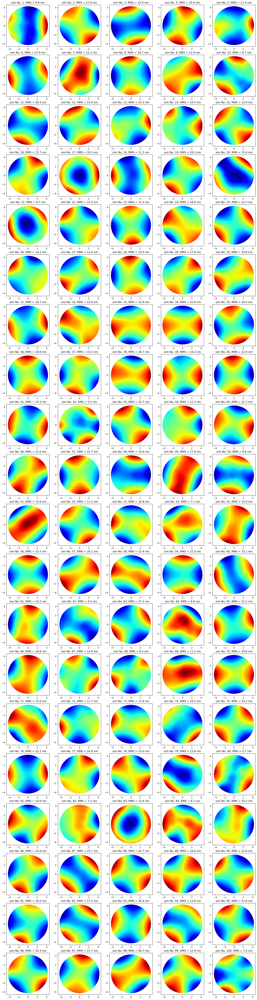

In [37]:
mu, sigma = 0, 1.0 # mean and standard deviation
nrow = 20

BMcoeff = np.zeros((5*nrow, nact))
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))

for i in range(5*nrow):
    irow = np.int8(i/5)
    icol = np.mod(i,5)

    f = np.random.normal(mu, sigma, nact)
    surf = Afz@f
    img = ax[irow][icol].scatter(nodex, nodey,10, surf)
    ax[irow][icol].set_title('sim No. %d, RMS = %.1f nm'%(i+1, np.std(surf)*1e9))
    BMcoeff[i,:] = UMat.transpose()@surf/nnode

In [38]:
#check the BM decomposition gives the same RMS as the influence matrix
np.sqrt(np.sum(BMcoeff[i,:]**2))

6.980725882997965e-09

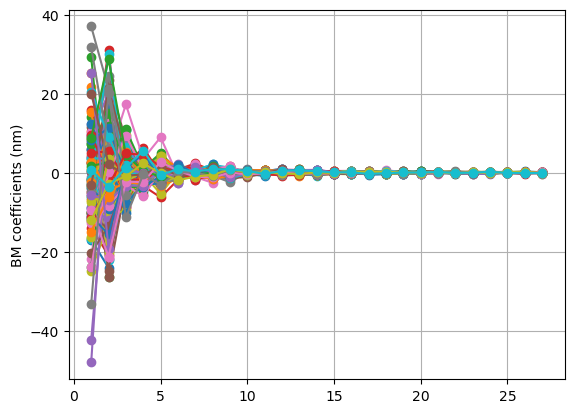

In [39]:
for i in range(nrow*5):
    plt.plot(np.arange(1, 27+1), BMcoeff[i,:27]*1e9,'-o', label='sim No. %d'%i)
    plt.ylabel('BM coefficients (nm)')
plt.grid();

In [40]:
np.std(BMcoeff, axis=0)[:27]*1e9

array([14.01647127, 13.58919144,  5.06205867,  2.55631613,  2.32300094,
        1.06453694,  0.95180943,  0.91883264,  0.79255644,  0.38870547,
        0.35733861,  0.37918344,  0.37789617,  0.3624038 ,  0.21547836,
        0.18486763,  0.19831686,  0.19922331,  0.1767518 ,  0.14744322,
        0.11395874,  0.1222721 ,  0.11059678,  0.10656815,  0.09289331,
        0.09724931,  0.08509754])

### Absolute force accuracy is +/- 10N

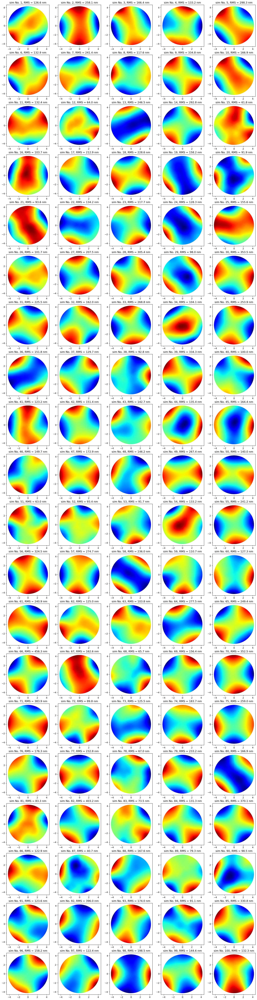

In [ ]:
mu, sigma = 0, 10. # mean and standard deviation
nrow = 20

BMcoeff = np.zeros((5*nrow, nact))
fig, ax = plt.subplots(nrow,5,figsize=(20,4*nrow))

for i in range(5*nrow):
    irow = np.int8(i/5)
    icol = np.mod(i,5)

    f = np.random.normal(mu, sigma, nact)
    surf = Afz@f
    img = ax[irow][icol].scatter(nodex, nodey,10, surf)
    ax[irow][icol].set_title('sim No. %d, RMS = %.1f nm'%(i+1, np.std(surf)*1e9))
    BMcoeff[i,:] = UMat.transpose()@surf/nnode

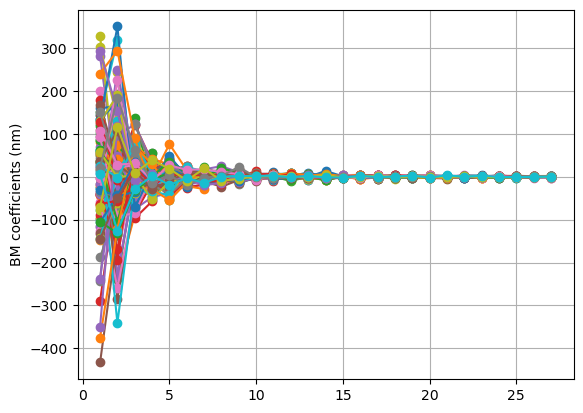

In [42]:
for i in range(nrow*5):
    plt.plot(np.arange(1, 27+1), BMcoeff[i,:27]*1e9,'-o', label='sim No. %d'%i)
    plt.ylabel('BM coefficients (nm)')
plt.grid();

In [43]:
np.std(BMcoeff, axis=0)[:27]*1e9

array([134.72370623, 133.03904561,  51.52204817,  24.90540297,
        25.01925474,  11.41308439,  10.27489619,   7.82346512,
         8.13097957,   4.03257316,   3.54206134,   3.92389099,
         3.00027433,   3.48430316,   1.87289195,   2.01673089,
         1.98745435,   1.74368796,   1.61293205,   1.58629824,
         1.20141443,   1.17789215,   1.19874841,   1.13773741,
         0.98377201,   0.74605852,   0.79968623])